
---
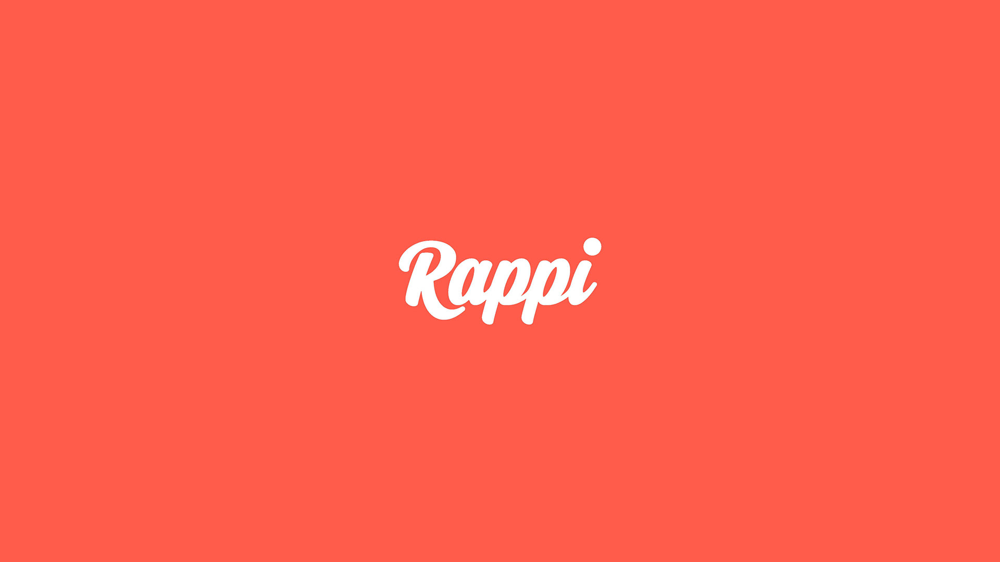


---





# **Instalação dos pacotes**

Abaixo estão as bibliotecas usadas para manipulação dos dados


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
from datetime import date
from datetime import datetime
import numpy as np;
import seaborn as sns; sns.set();
import plotly.express as px;

# **Importando dados da planilha CSV**


Abaixo importamos os dados das planilhas que se encontram em nosso drive e transformamos em DataFrame.

Obs: A variável "df_contas_churn" precisou ser inserida em uma nova célula, pois devido ao seu tamanho, ela precisa ser separada das demais variáveis para rodar devidamente.

In [ ]:
df_contas_churn = pd.read_csv("/content/drive/MyDrive/Bases Rappi/Copy of criacao contas churn-002.csv")

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2882: DtypeWarning: Columns (6) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [ ]:
df_supply = pd.read_csv("/content/drive/MyDrive/Bases Rappi/Copy of supply.csv")
df_product = pd.read_csv("/content/drive/MyDrive/Bases Rappi/Copy of Product return.csv")
df_ordens = pd.read_csv("/content/drive/MyDrive/Bases Rappi/Copy of Ordens Done e Cancel.csv")
df_incidentes = pd.read_csv("/content/drive/MyDrive/Bases Rappi/Copy of Incidentes_Regras RT.csv")
df_earnings = pd.read_csv("/content/drive/MyDrive/Bases Rappi/Copy of earnings.csv")
df_defects = pd.read_csv("/content/drive/MyDrive/Bases Rappi/Copy of comp defects.csv")
df_rate = pd.read_csv("/content/drive/MyDrive/Bases Rappi/Copy of attendance rate.csv")
df_infos_gerais = pd.read_csv("/content/drive/MyDrive/Bases Rappi/Copy of infos gerais.csv")
df_tempo_resolucao = pd.read_csv("/content/drive/MyDrive/Bases Rappi/Copy of tempo resolutcao e modal-001.csv")

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2882: DtypeWarning: Columns (6) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


# **Retorno médio de cada vertical**


* Iniciamos a análise observando quais verticais são mais rentáveis para os entregadores; 

* Utilizamos a planilha intitulada de "Product Return" para calcular a média do retorno de cada vertical;

* As colunas utilizadas para análise foram 'VERTICAL_SUB_GROUP' e 'PRODUCT_RETURNS'


In [ ]:
# Retorno médio de cada vertical

list_verticals = []
list_return = []

#coletar os nomes 
verticals = df_product['VERTICAL_SUB_GROUP'].drop_duplicates()

for i in verticals:
    list_verticals.append(i)

for i in list_verticals:
    vert_mean = df_product[df_product['VERTICAL_SUB_GROUP'] == i]['PRODUCT_RETURNS'].mean()
    list_return.append(vert_mean * -1)

fig = px.bar(x=list_verticals, y=list_return, title='Verticais mais rentáveis')
fig.show()

# Qual vertical possui o maior retorno médio?

# **Categorias com mais horas médias de entregas**

* A planilha abaixo permite o entendimento de quais categorias de entregadores possui maior número médio de horas trabalhadas na plataforma;

* O fato da categoria "danger" ser a segunda categoria com mais horas nos surpreendeu bastante, uma vez que é uma categoria com alta propensão a dar churn, segundo o Raphael;

* Todos os dados usados no estudo foram coletados da planilha intitulada de "supply";

* As colunas utilizadas para análise foram 'LEVEL_NAME_2' e 'SUPPLY_HOURS'

In [ ]:
names = ['diamond', 'silver', 'bronze', 'danger']
mean = []

for i in names:
    med = df_supply[df_supply['LEVEL_NAME_2'] == i ]['SUPPLY_HOURS'].mean()
    mean.append(med)

fig = px.bar(x=names, y=mean, title='Categorias com mais horas de entregas')
fig.show()

# Quem mais trabalha?

# **Earning médio dos entregadores** 

* O gráfico abaixo indica o ganho médio de todos os entregadores da plataforma (desconsiderando as gorjetas) ao longo de 2021 e 2022;

* O pico de receita dos entregadores no final do ano levantou uma curiosidade: O nível de churns aumentam nos meses posteriores a dezembro devido a essa queda na receita?

* Todos os dados usados no estudo foram coletados da planilha intitulada de "earnings";

* As colunas utilizadas para análise foram 'MONTH' e 'EARNINGS'

In [ ]:
earning_month = []
earning_quant = []
dataa = df_earnings['MONTH'].drop_duplicates()

for i in dataa:
    mean = df_earnings[df_earnings['MONTH'] == i]['EARNINGS'].mean()
    earning_quant.append(mean)
    earning_month.append(i)
    
# plt.plot(bb, aa)  
# plt.xticks(rotation = 75)
# plt.rcParams["figure.figsize"]=(15,10)

fig = px.line(x=earning_month, y=earning_quant, title='Ganhos Mensais')
fig.show()

#Desde o inicio de 2022, a receita media dos entregadores apresentou uma queda substancial

# **Quantidade de entregas diárias que um entregador fez nas últimas semanas (individual)**#

* O gráfico abaixo permite a visualização da quantidade de entregas que um entregador fez nas suas últimas semanas;

* Dessa forma, podemos entender se há um padrão de queda no número de entregas de um storekeeper que deu churn;

* Todos os dados usados no estudo foram coletados da planilha intitulada de "supply";

* As colunas utilizadas para análise foram 'STOREKEEPER_ID', 'NUM_ORDERS' e 'DATE'

* Individual

In [ ]:
#Quantidade de entregas diárias do storekeeper 2 semanas 

storekeeper_id = 74094
var_null = df_supply[df_supply['STOREKEEPER_ID'] == 74094]['NUM_ORDERS']
list_num_orders = []
list_date_orders = []

num_orders = df_supply[df_supply['STOREKEEPER_ID'] == storekeeper_id]['NUM_ORDERS']
date_orders = df_supply[df_supply['STOREKEEPER_ID'] == storekeeper_id]['DATE']

for i in num_orders:
    list_num_orders.append(i)
for i in date_orders:
    list_date_orders.append(i)
    

fig = px.bar(x=list_date_orders, y=list_num_orders, title='Entregas diárias nas últimas 2 semanas')
fig.show()


#Quantas entregas o storekeeper fez nas ultimas semanas? (da menor para a maior data)

# **Receita mensal de um entregador nos últimos meses desconsiderando a gorjeta (individual)**


* O gráfico abaixo nos permite visualizar as receitas mensais do entregador nos últimos meses;

* Dessa forma, podemos entender se há um padrão nas receitas do entregador que deu churn;

* Todos os dados usados no estudo foram coletados da planilha intitulada de "earnings";

* As colunas utilizadas para análise foram 'STOREKEEPER_ID', 'MONTH' e 'EARNINGS'

In [ ]:
id_entregador = 74094   #int(input("Digite o ID do entregador"))
earnings_months = df_earnings[df_earnings['STOREKEEPER_ID'] == id_entregador]['MONTH']
earnings_earn = df_earnings[df_earnings['STOREKEEPER_ID'] == id_entregador]['EARNINGS']

# plt.plot(earnings_months, earnings_earn)  
# plt.xticks(rotation = 75)
# plt.gcf().set_size_inches(10, 8)

fig = px.line(x=earnings_months, y=earnings_earn, title='Ganhos Mensais')
fig.show()

#Receita de um entregador nos últimos meses(desconsiderando a gorjeta)

# **Ganhos outliers**

* O gráfico abaixo plota os ganhos mensais de todos os entregadores da plataforma;

* Identificamos alguns ganhos mensais que estão extremamente acima da média, beirando a casa dos 100 mil reais, o que pode acabar atrapalhando o. Sendo assim, para melhorar a precisão das nossas previsões, será necessário remove-los.

* Todos os dados usados no estudo foram coletados da planilha intitulada de "earnings";

* As colunas utilizadas para análise foram 'MONTH' e 'EARNINGS'

In [ ]:
month = []
earnings = []

#media dos ganhos por mes

for i in df_earnings['MONTH']:
    month.append(i)

for i in df_earnings['EARNINGS']:
     earnings.append(i)
    
# plt.scatter(month,earnings,s=100)

fig = px.scatter(x=month, y=earnings, title='Outliers')

fig.show()